# Imports and Hyperparameters

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST

plt.style.use('standard.mplstyle')

In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "pancreas_full"

# for the filename
parameters = "2-0_5"

# Data Preperation

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2)
position, labels, embedding = data_loader(dataset, True)
# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)
cluster_centers = centers(pca)
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)

print("Time for data preperation: ", time.time()-start)

sklearn is done: 112.80771279335022
My own part is done: 3.148587703704834
Time for data preperation:  275.72409772872925


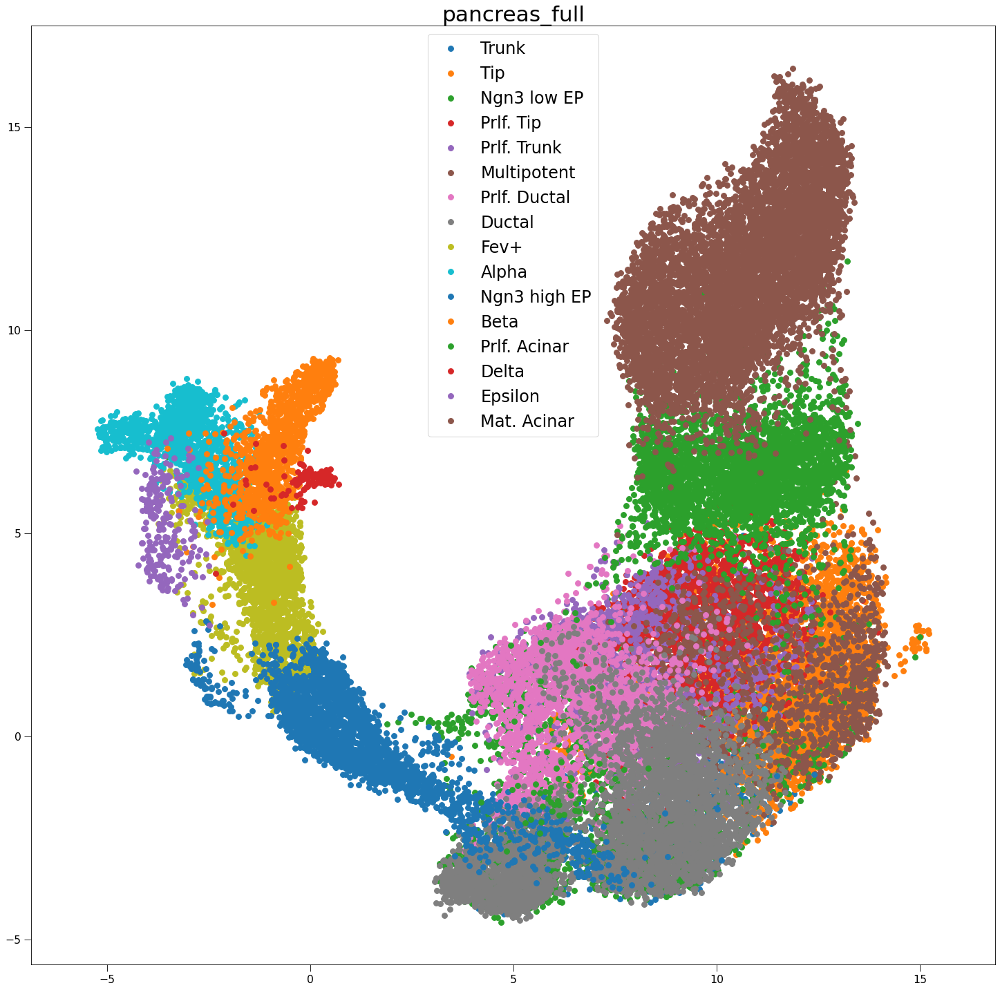

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [8]:
# Create the graph
start = time.time()
    
G, _ = create_graph(number_of_nodes, mode, position=pca, beta=2, delta=0.5)
G.indexEdges()
print("Time for graph construction: ",time.time()-start)

Final k: 11



Time for graph construction:  424.8913598060608


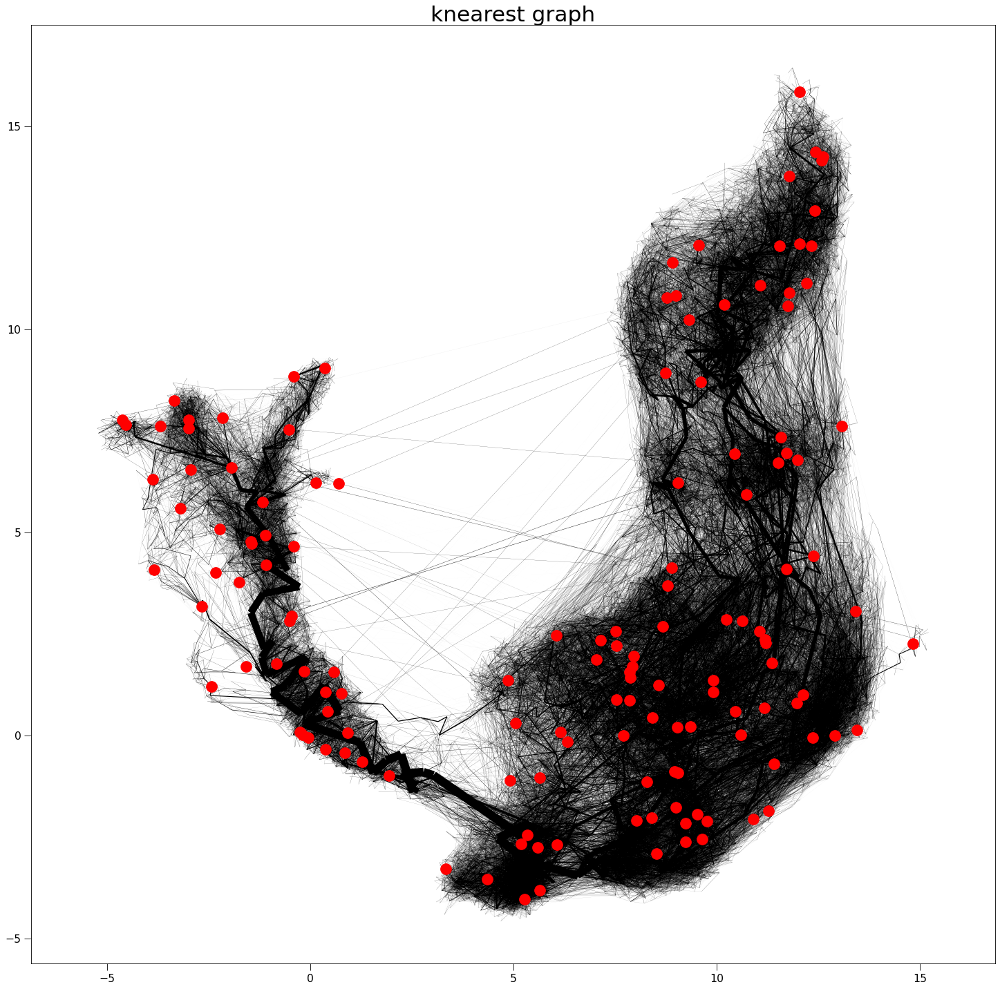

In [9]:
# plot the graph
fig, ax = plt.subplots(1, figsize=(24,24))
plot_graph(G, embedding, "knearest graph", ax, cluster_centers, node_size=0)
plt.show()

## Cluster ICT

In [10]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()
print("Time for calculating the actual ICT: ", time.time()-start)

update Arr 335956 -> 139757
added 1264 edges early
update Arr 139757 -> 127014
added 534 edges early
update Arr 127014 -> 115149
added 331 edges early
update Arr 115149 -> 104346
added 800 edges early
update Arr 104346 -> 94796
added 843 edges early
update Arr 94796 -> 86106
added 772 edges early
update Arr 86106 -> 77791
added 1363 edges early
update Arr 77791 -> 70615
added 2042 edges early
update Arr 70615 -> 63922
added 2464 edges early
update Arr 63922 -> 57966
added 1840 edges early
update Arr 57966 -> 52302
added 2309 edges early
update Arr 52302 -> 47389
added 2896 edges early
update Arr 47389 -> 43029
added 2451 edges early
update Arr 43029 -> 38899
added 2786 edges early
update Arr 38899 -> 36350
added 2090 edges early
added 10988 edges early

Time for calculating the actual ICT:  946.0489163398743


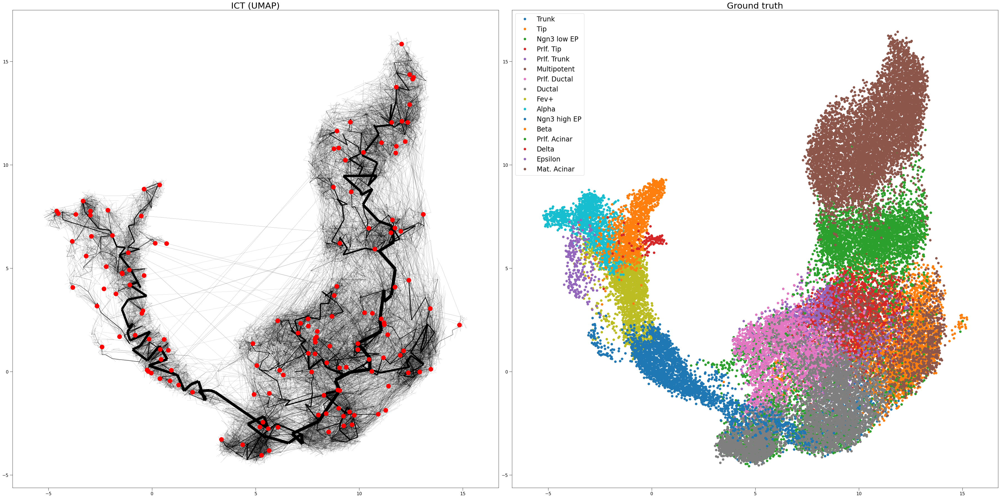

In [11]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

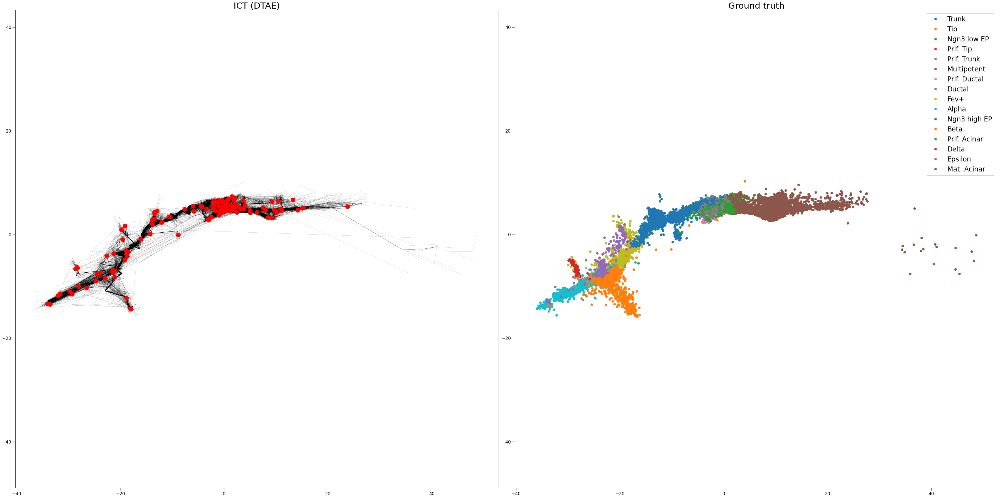

In [12]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

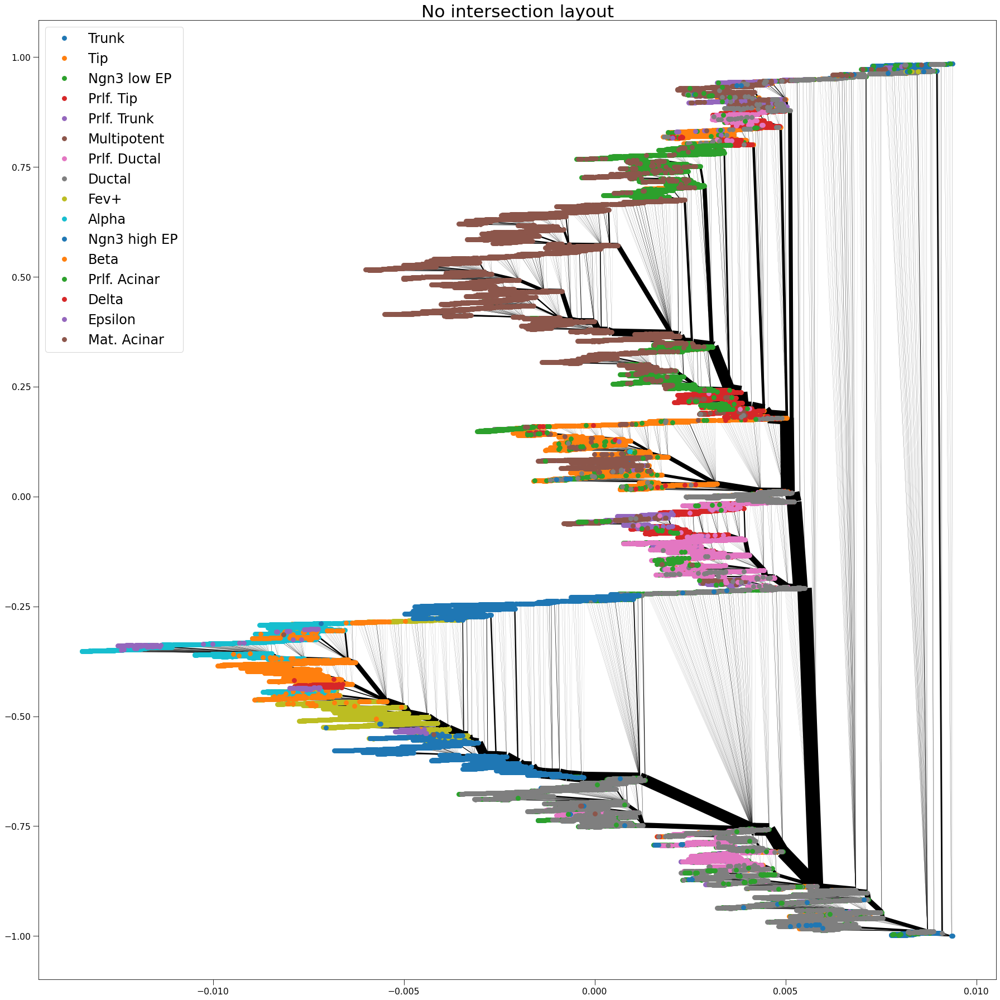

In [13]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()

# Create the MST for the DTAE autoencoder

In [14]:
nk.writeGraph(ICT,"/net/hcihome/storage/flernst/Data/eth/ICT", nk.Format.EdgeListTabOne)

sklearn is done: 36.78551650047302
My own part is done: 1.1468565464019775


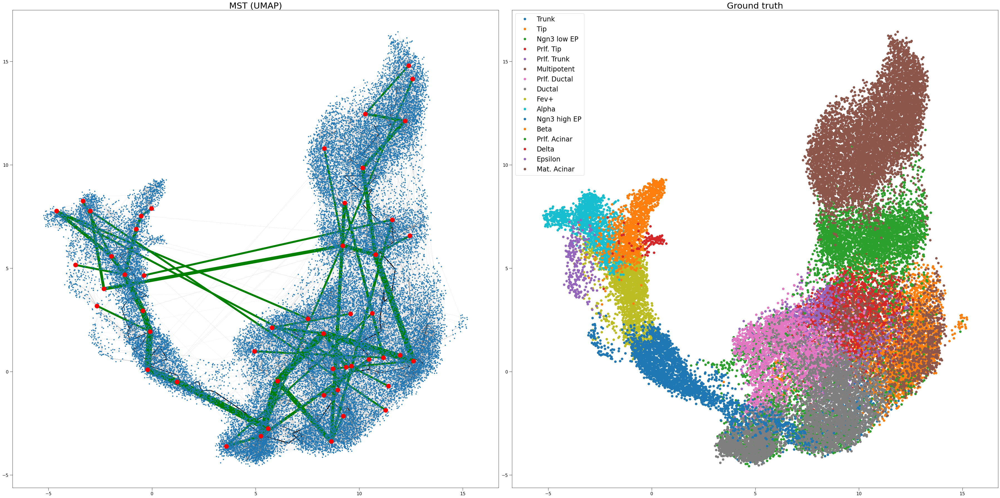

In [15]:
DTAE_centers = k_means_pp(50, pca)
mst = MST(ICT, position, DTAE_centers)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
plot_graph(ICT, embedding, "ICT (UMAP)", ax1, DTAE_centers, edge_scale=0.3)
plot_graph(mst, embedding[DTAE_centers], "MST (UMAP)", ax1, edge_scale=2, node_size=0, edge_color="green")
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-MST-"+parameters+".png")

plt.show()